In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matrixprofile import *
from matrixprofile.discords import discords

In [2]:
df = pd.read_csv('./dataset_preprocessed/time_series/time_series.csv')

In [3]:
labels = df.iloc[:,-1]
df.drop(columns=['genre'], inplace=True)

In [112]:
w = 6

res_list = []
for i in range(df.shape[0]):
    res_dict = {} # Dictionary that stores the result for this ts
    ts = df.iloc[i]
    mp, mpi = matrixProfile.stomp(ts.values, w)
    mo, mod = motifs.motifs(ts.values, (mp, mpi), max_motifs=3)
    anoms = discords(mp, ex_zone=8, k=3)

    res_dict['motifs'] = mo
    res_dict['discords'] = list(anoms)

    res_list.append(res_dict)
results = pd.DataFrame(res_list) # Final result in a dataframe

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/matrixprofile/utils.py:68: RuntimeWarning: invalid value encountered in sqrt
  movstd = np.sqrt(segSumSq / m - (segSum/m) ** 2)


CPU times: user 2min 3s, sys: 1.37 s, total: 2min 5s
Wall time: 2min 9s


In [113]:
results

,motifs,discords
0,"[[62, 84], [39, 74]]","[32, 48, 17]"
1,"[[14, 31, 41, 68], [10, 37], [61, 88]]","[85, 0, 16]"
2,"[[9, 48], [3, 21], [55, 78]]","[67, 76, 12]"
3,"[[52, 81], [68, 90], [3, 13, 73]]","[65, 49, 93]"
4,"[[12, 17, 22], [38, 67]]","[94, 78, 11]"
...,...,...
9995,"[[6, 36], [28, 88], [19, 32, 40, 66]]","[58, 35, 70]"
9996,"[[19, 44], [28, 74, 87], [56, 79]]","[62, 93, 82]"
9997,"[[44, 55, 66, 74], [3, 8, 19, 80, 90]]","[35, 84, 43]"
9998,"[[27, 89], [9, 55]]","[26, 41, 78]"


A couple of ts visualized with both motifs and discords, just to see it works

In [ ]:
for i in range(6):
    ts = df.iloc[i]
    plt.plot(ts.values)
    mo = results.iloc[i,0]
    anoms = results.iloc[i,1]
    
    colors = ['r', 'g', 'k'][:len(mo)]
    for m, c in zip(mo, colors):
        for j in m:
            m_shape = ts.values[j:j+w]
            plt.plot(range(j,j+w), m_shape, color=c, lw=3)
    plt.show()

    plt.plot(ts.values)
    for a, c in zip(anoms, colors):
        a_shape = ts.values[a:a+w]
        plt.plot(range(a, a+w), a_shape, color=c, lw=3)

    plt.show()

In [114]:
results.to_csv('./dataset_preprocessed/time_series/motifs_discords.csv')

# Comparing with Shapelets

In [4]:
motifs_discords = pd.read_csv('./dataset_preprocessed/time_series/motifs_discords.csv')
shapelets = np.load('./dataset_preprocessed/time_series/shapelets.npy', allow_pickle=True)
shapelets = pd.DataFrame(shapelets, columns=['gain', 'length', 'start_position', 'dimension', 'index', 'genre', 'shapelet'])

In [5]:
# Repeating the split done during shapelet extraction to find the correct training set to compare
from sklearn.model_selection import train_test_split
import ast

X = df.values
y = labels.values
X = np.reshape(X, (10000, 1, 100))
indices = np.arange(10000)
X_train, X_test, y_train, y_test, indices_train, indices_test = train_test_split(X,
                                                                y,
                                                                indices,
                                                                train_size=0.8,
                                                                shuffle=True,
                                                                stratify=y,
                                                                random_state=0
                                                                )

In [6]:
w = 6

opera


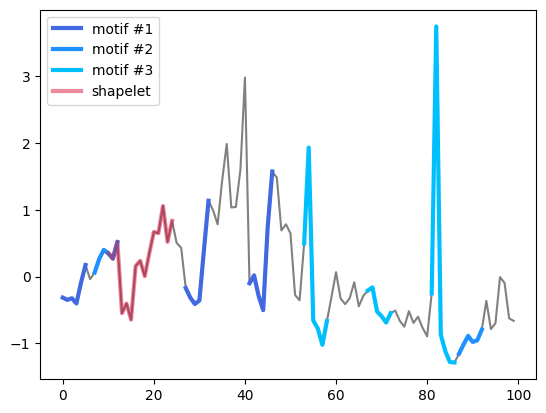

minimal-techno


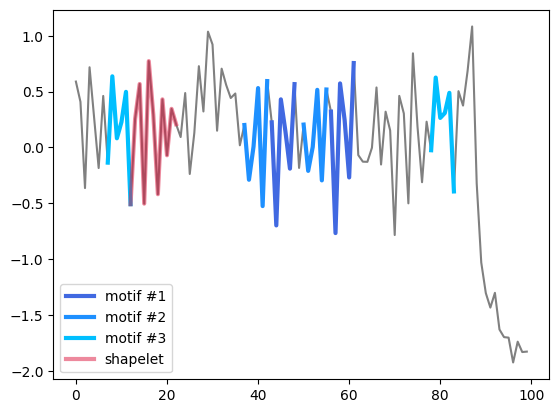

goth


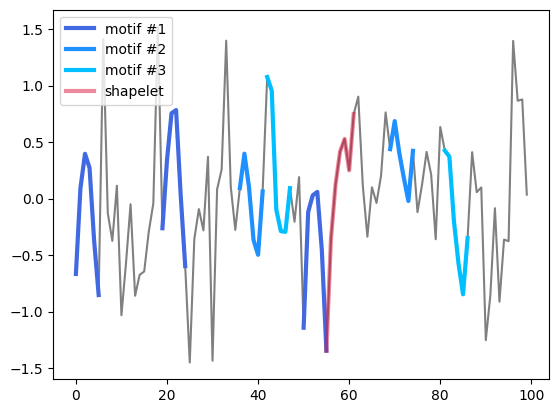

emo


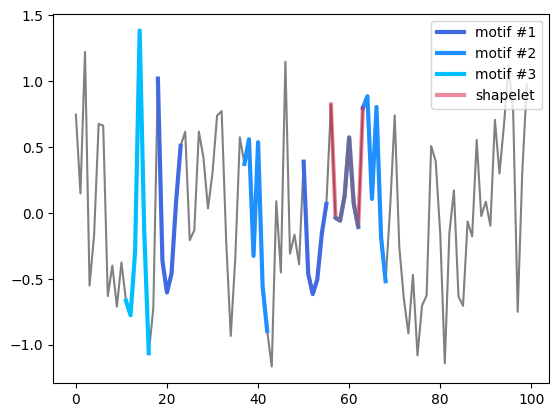

new-age


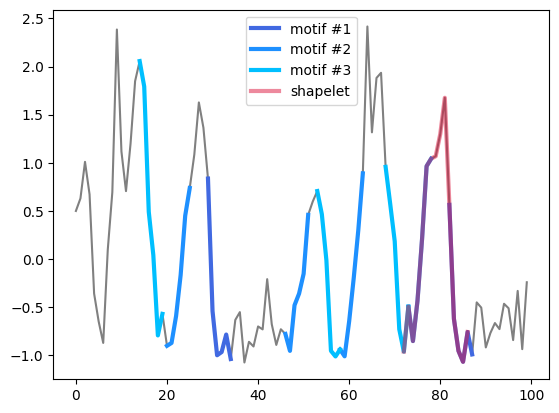

mpb


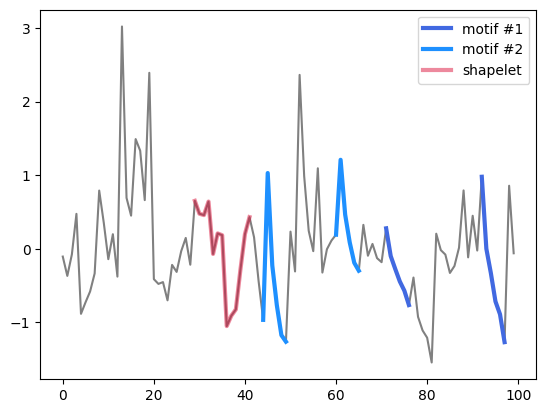

heavy-metal


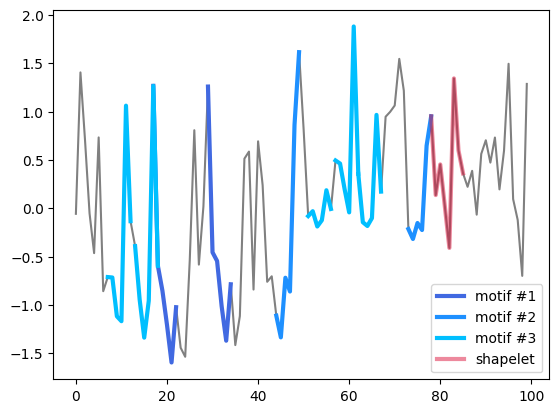

salsa


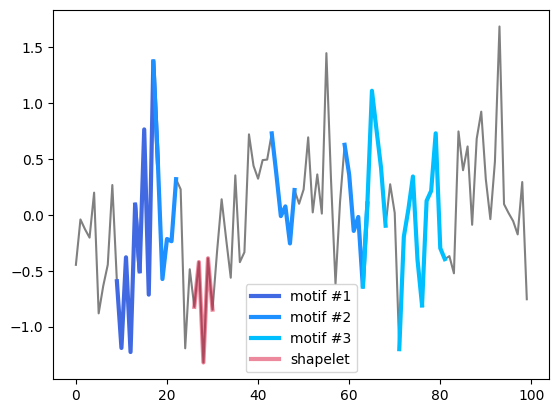

sleep


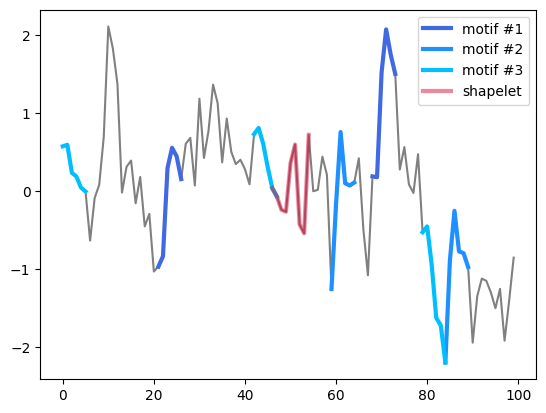

world-music


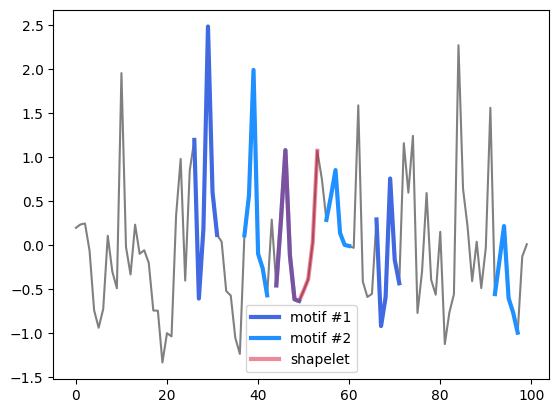

honky-tonk


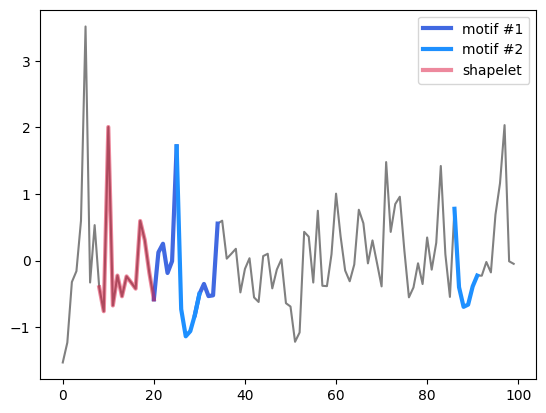

kids


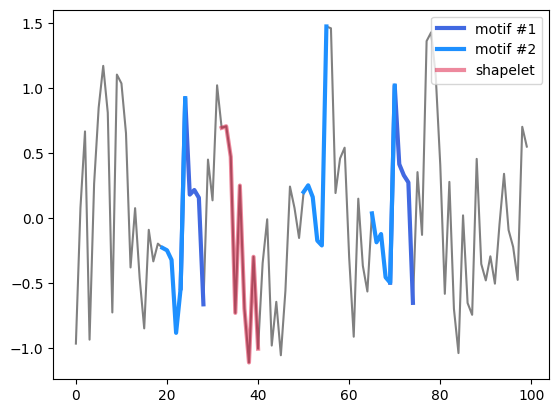

folk


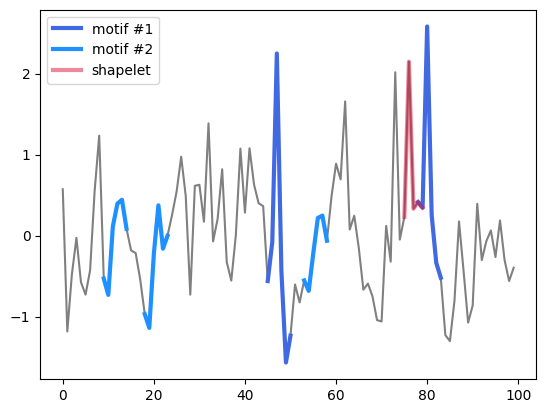

j-idol


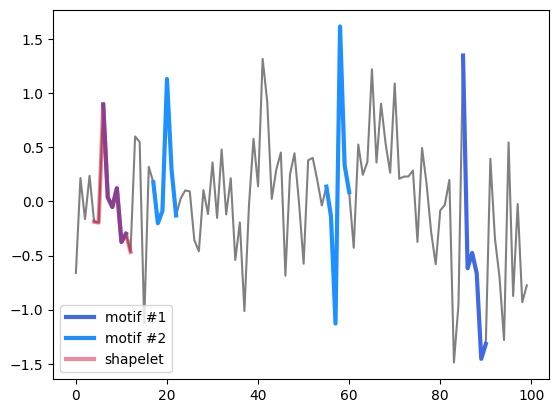

happy


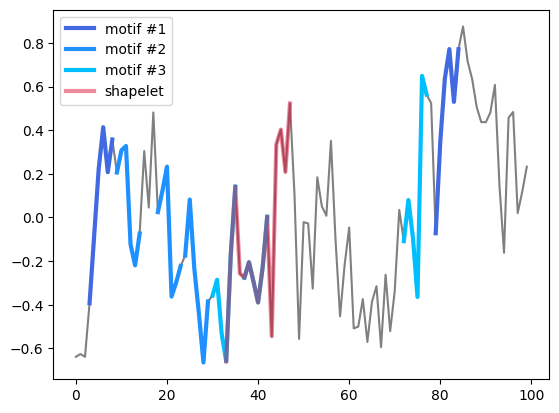

sertanejo


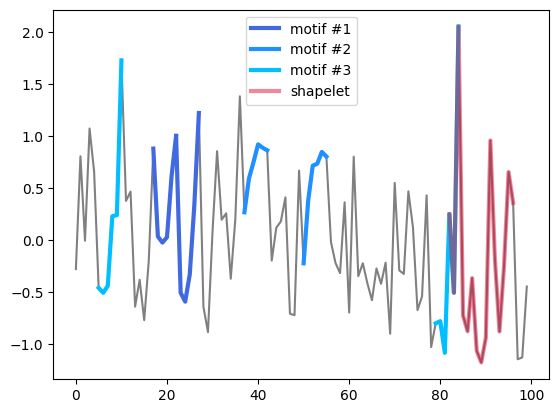

synth-pop


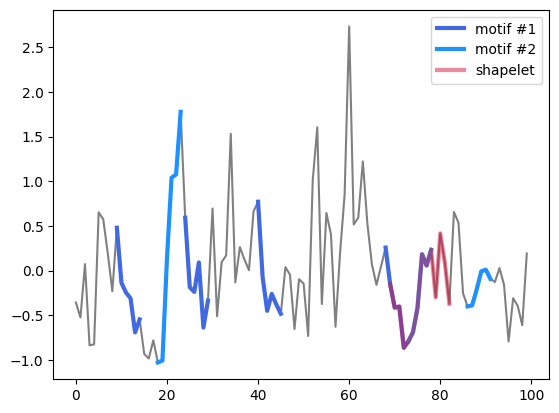

songwriter


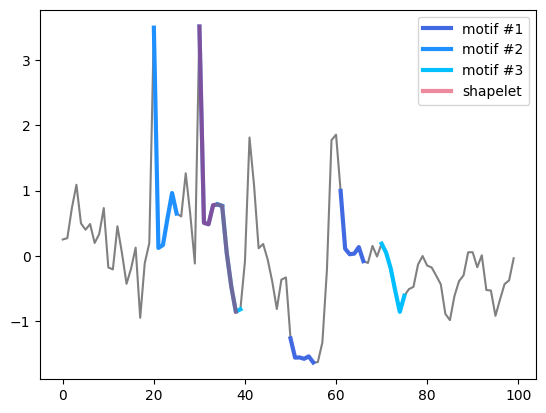

progressive-house


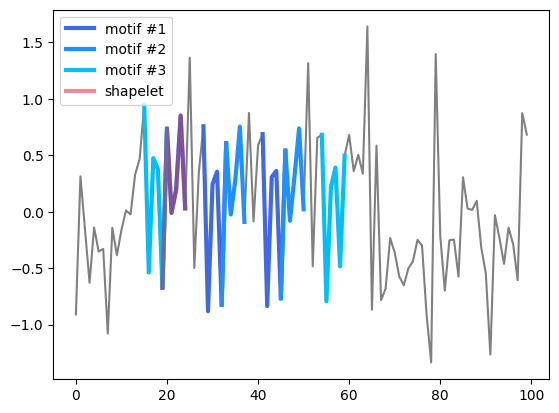

piano


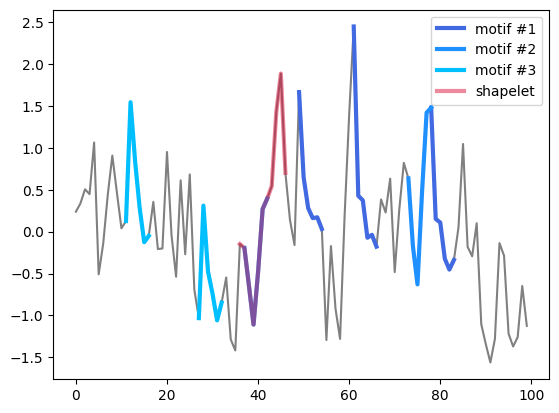

In [138]:
for genre in labels.unique():
    print(genre)
    grouped_shapelets = shapelets.where(shapelets['genre'] == genre).dropna()
    grouped_shapelets.reset_index(drop=True, inplace=True)

    ts = X_train[grouped_shapelets.iloc[1]['index']].reshape(100)
    ts_index = indices_train[grouped_shapelets.iloc[1]['index']]

    plt.plot(ts, color='gray')

    # Plotting the motifs and discords
    mo = ast.literal_eval(motifs_discords.iloc[ts_index]['motifs'])
    anoms = sorted(ast.literal_eval(motifs_discords.iloc[ts_index]['discords']))
    
    colors = ['royalblue', 'dodgerblue', 'deepskyblue'][:len(mo)]

    # Motifs
    for m, c in zip(mo, colors):
        for j in m:
            m_shape = ts[j:j+w]
            plt.plot(range(j,j+w), m_shape, color=c, lw=3)
        plt.plot([0], [0], color=c, lw=3, label=f'motif #{mo.index(m)+1}')
    
    # Discords
    #for a, c in zip(anoms, colors):
    #    a_shape = ts[a:a+w]
    #    plt.plot(range(a, a+w), a_shape, color=c, lw=3, label=f'discord #{anoms.index(a)+1}')

    # Plotting the shapelet
    shapelet_start = grouped_shapelets.iloc[1]['start_position']
    shapelet_end = shapelet_start + grouped_shapelets.iloc[1]['length']
    plt.plot(np.arange(shapelet_start, shapelet_end),
             ts.ravel()[shapelet_start:shapelet_end], 
             lw=3,
             label='shapelet',
             color='crimson',
             alpha=0.5)
    
    plt.legend()
    plt.show()

#### Only motifs

opera


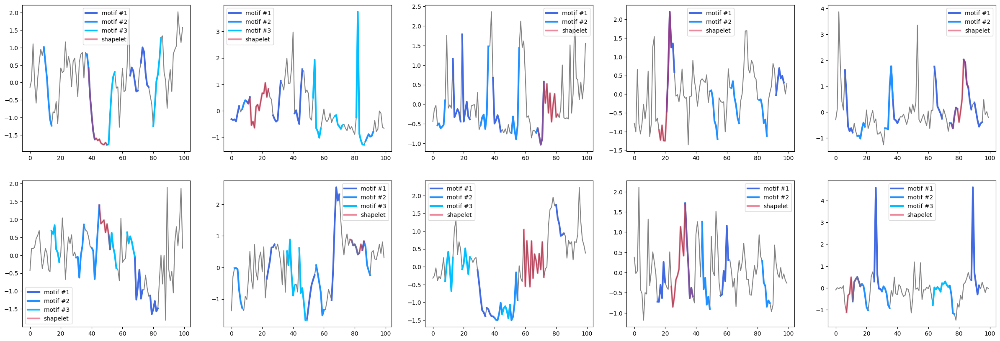

minimal-techno


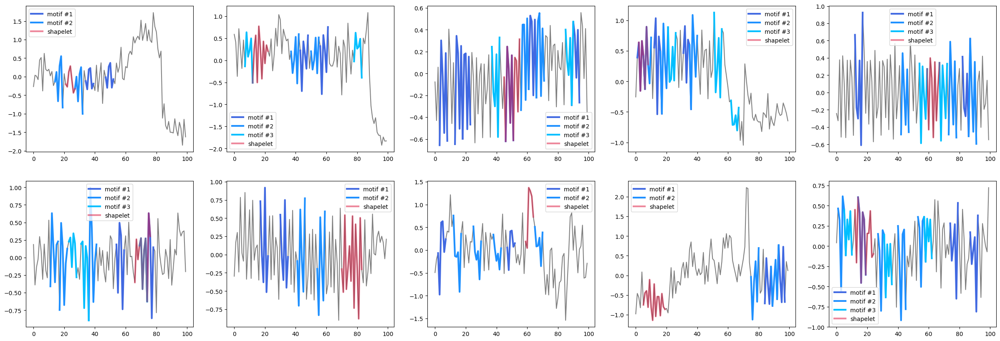

goth


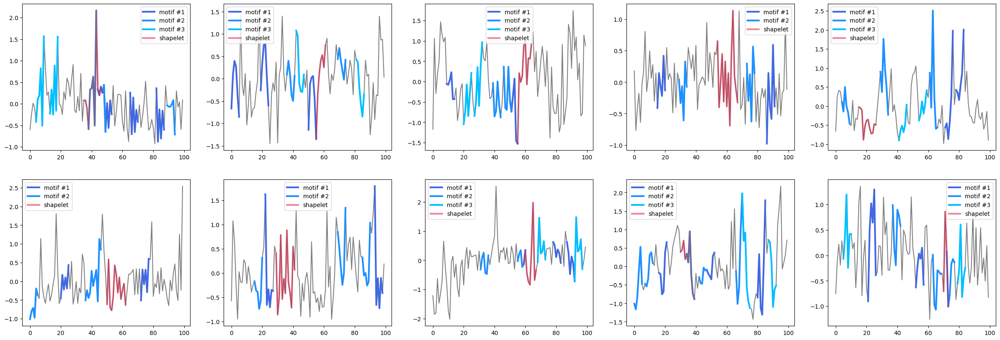

emo


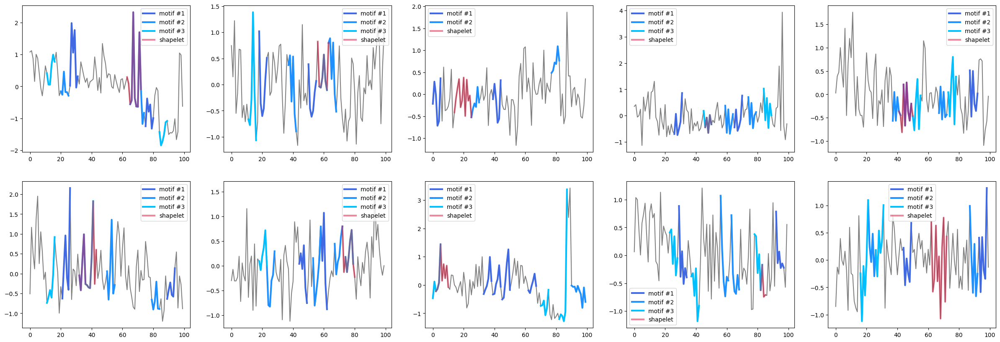

new-age


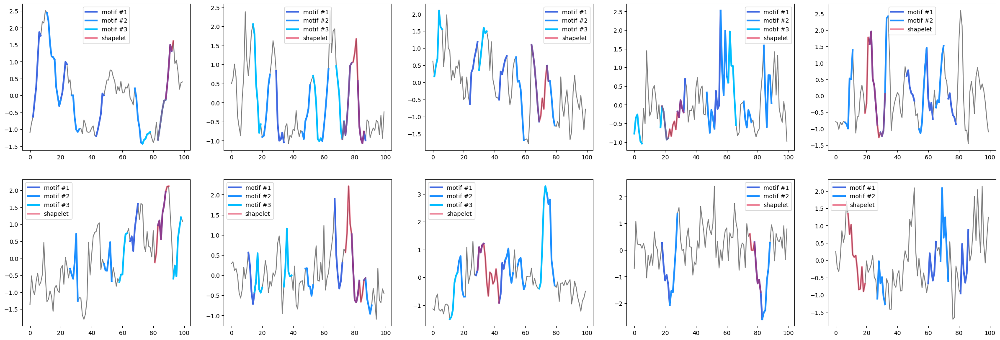

mpb


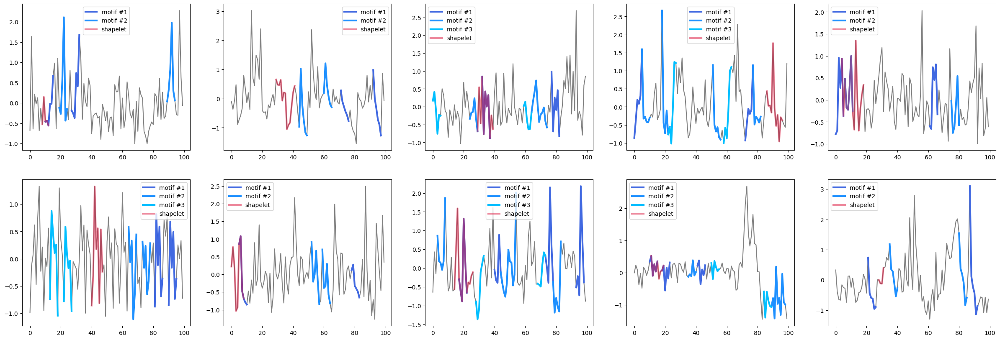

heavy-metal


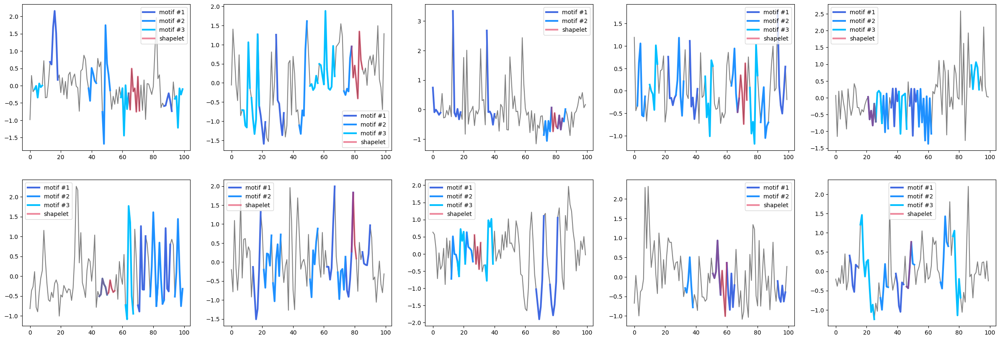

salsa


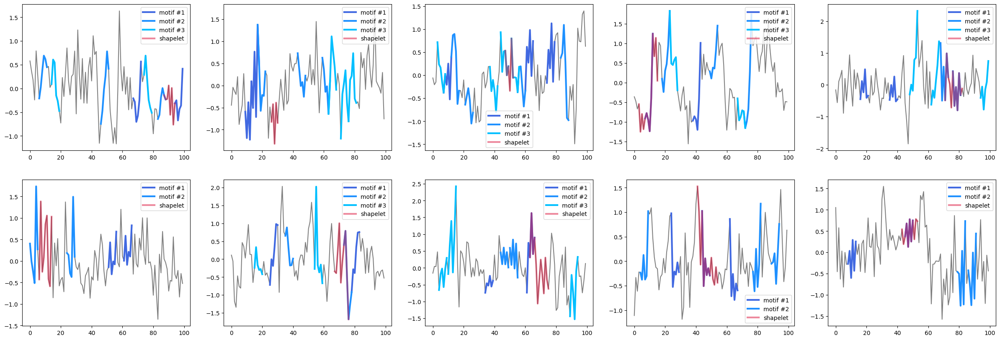

sleep


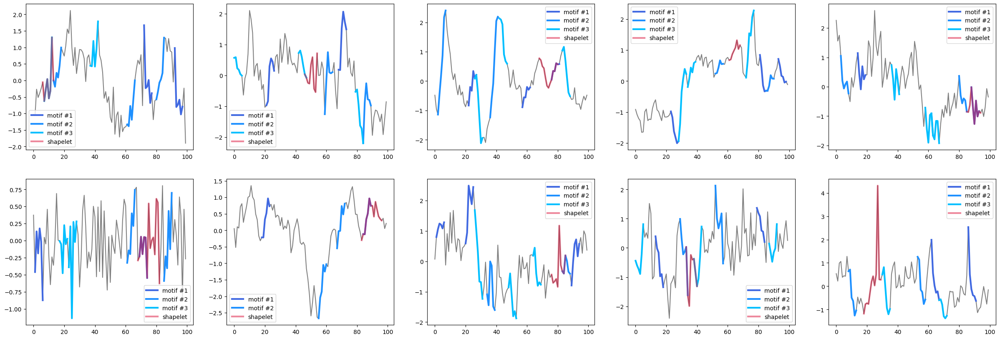

world-music


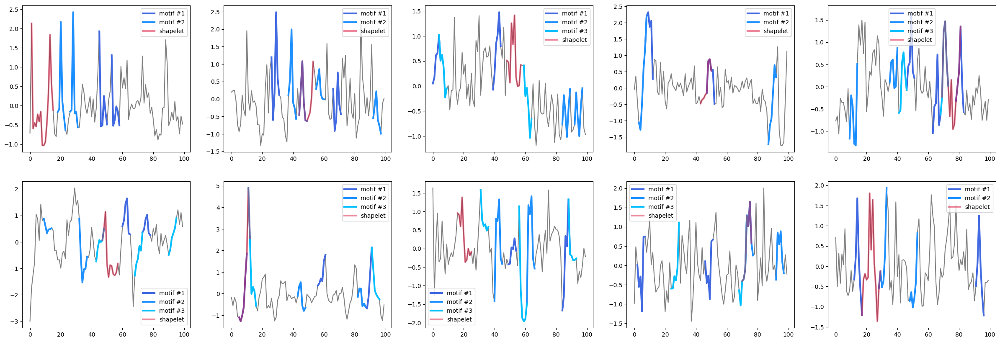

honky-tonk


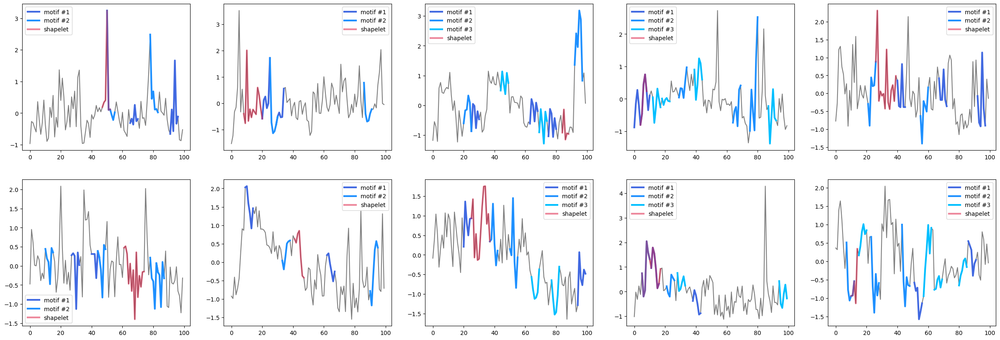

kids


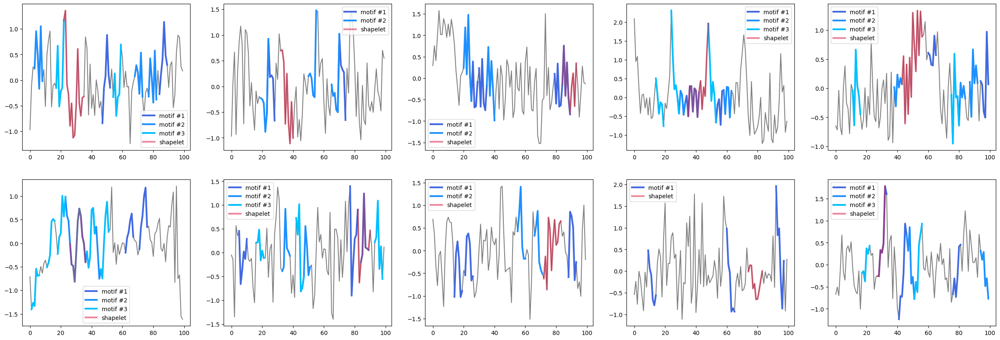

folk


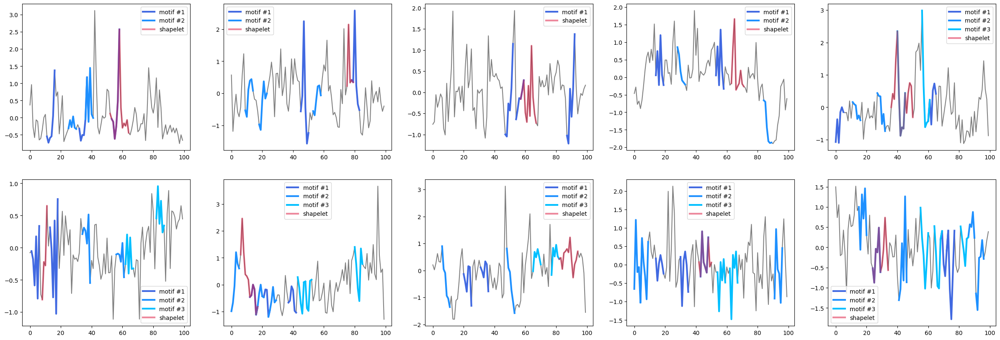

j-idol


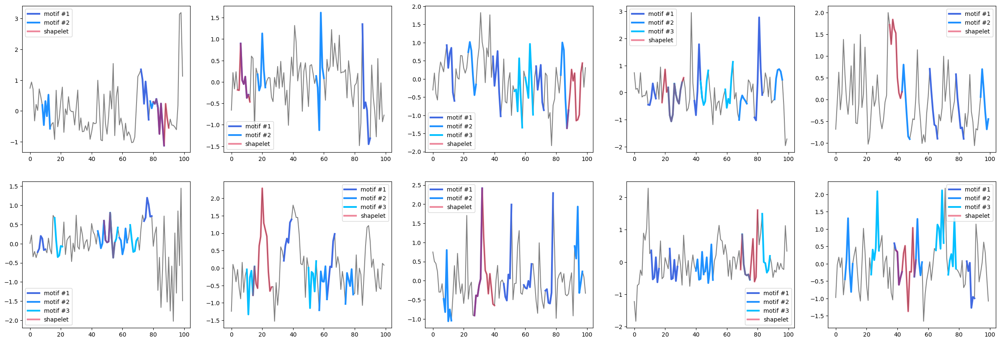

happy


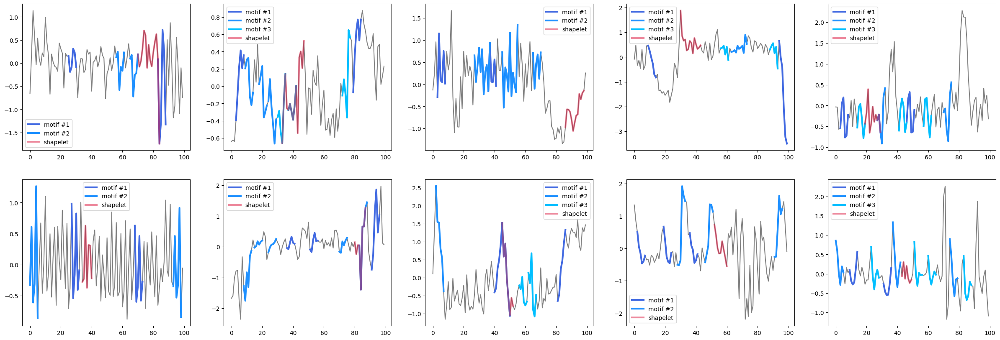

sertanejo


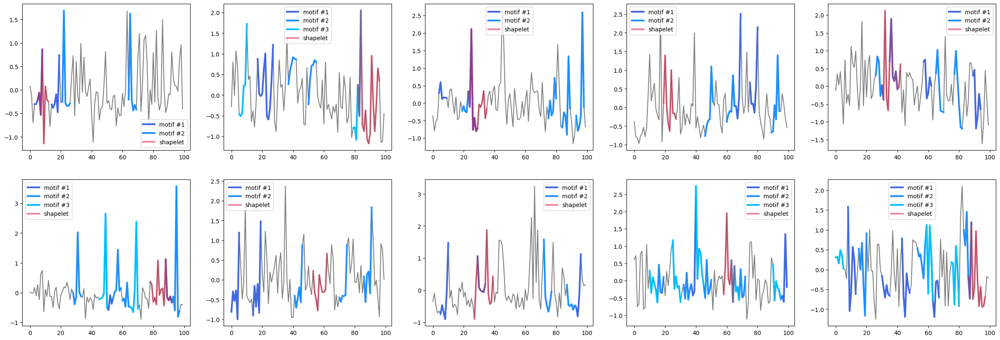

synth-pop


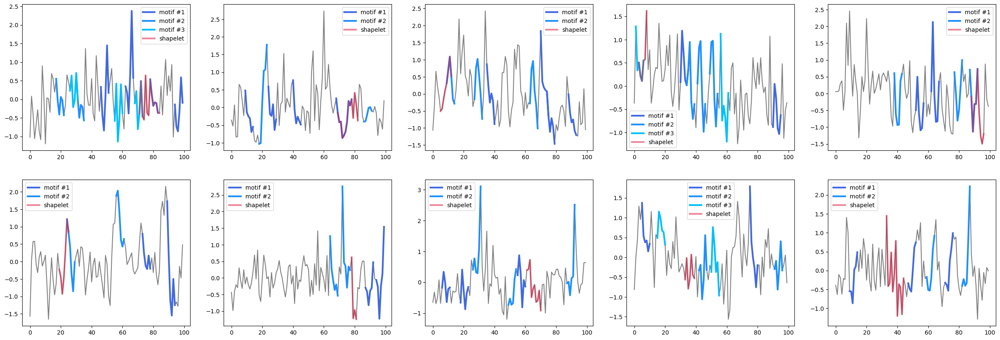

songwriter


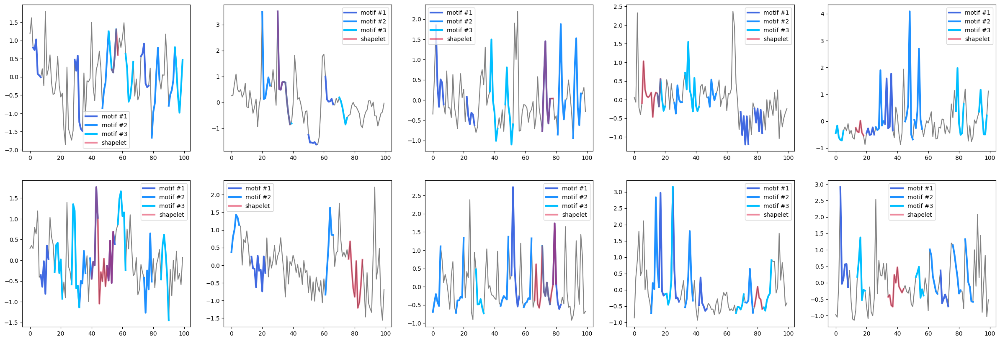

progressive-house


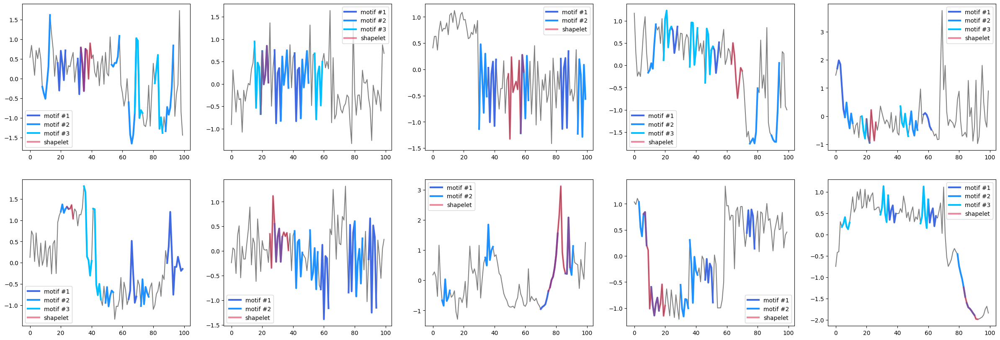

piano


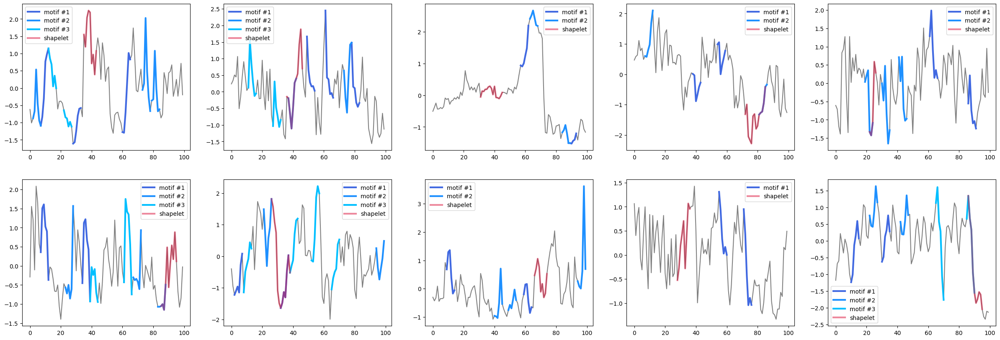

In [14]:
for genre in labels.unique():
    print(genre)
    grouped_shapelets = shapelets.where(shapelets['genre'] == genre).dropna()
    grouped_shapelets.reset_index(drop=True, inplace=True)

    fig, axs = plt.subplots(2, 5, figsize=(30, 10))

    for i, ax in zip(range(10), axs.flat):
        ts = X_train[grouped_shapelets.iloc[i]['index']].reshape(100)
        ts_index = indices_train[grouped_shapelets.iloc[i]['index']]

        ax.plot(ts, color='gray')

        # Plotting the motifs and discords
        mo = ast.literal_eval(motifs_discords.iloc[ts_index]['motifs'])
        anoms = sorted(ast.literal_eval(motifs_discords.iloc[ts_index]['discords']))
        
        colors = ['royalblue', 'dodgerblue', 'deepskyblue'][:len(mo)]

        # Motifs
        for m, c in zip(mo, colors):
            for j in m:
                m_shape = ts[j:j+w]
                ax.plot(range(j,j+w), m_shape, color=c, lw=3)
            ax.plot([0], [0], color=c, lw=3, label=f'motif #{mo.index(m)+1}')
        
        # Discords
        #for a, c in zip(anoms, colors):
        #    a_shape = ts[a:a+w]
        #    plt.plot(range(a, a+w), a_shape, color=c, lw=3, label=f'discord #{anoms.index(a)+1}')

        # Plotting the shapelet
        shapelet_start = grouped_shapelets.iloc[i]['start_position']
        shapelet_end = shapelet_start + grouped_shapelets.iloc[i]['length']
        ax.plot(np.arange(shapelet_start, shapelet_end),
                ts.ravel()[shapelet_start:shapelet_end], 
                lw=3,
                label='shapelet',
                color='crimson',
                alpha=0.5)
        ax.title(f'Shapelet of genre={genre}')
        ax.legend()
    plt.show()

#### Only discords

opera


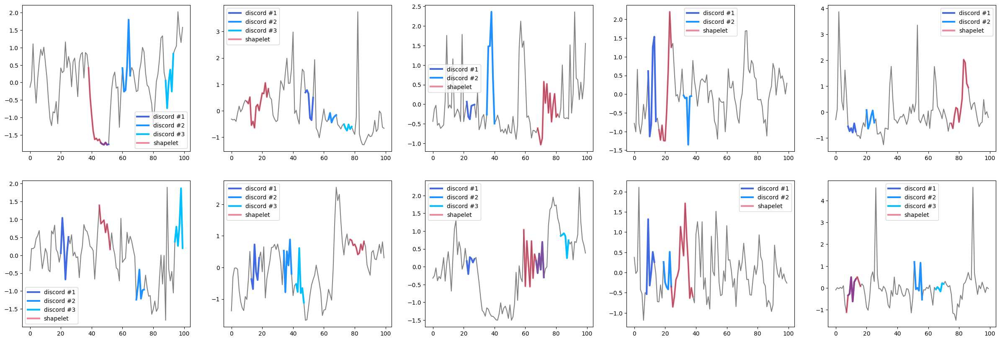

minimal-techno


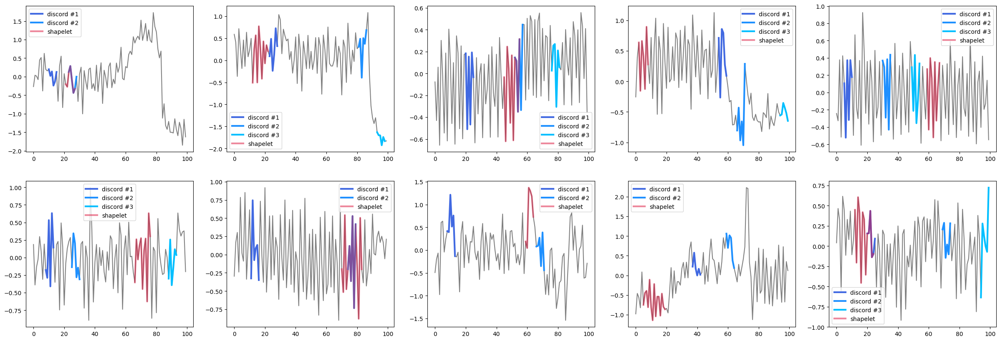

goth


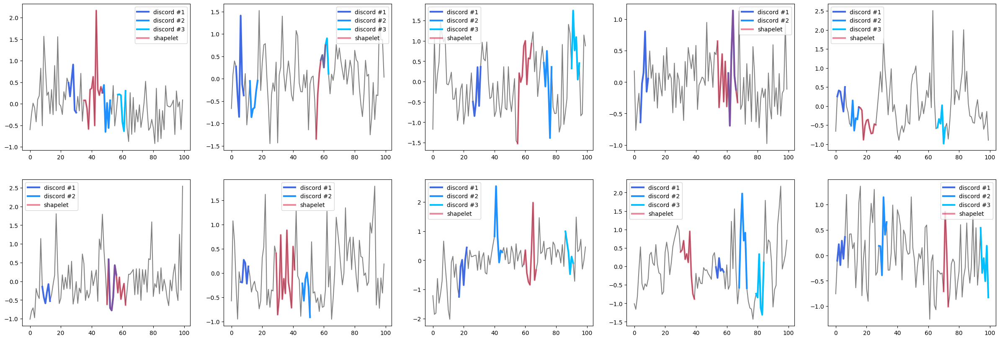

emo


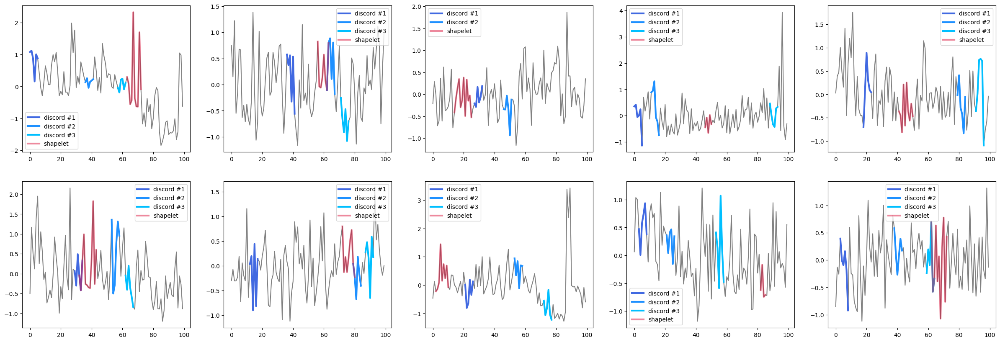

new-age


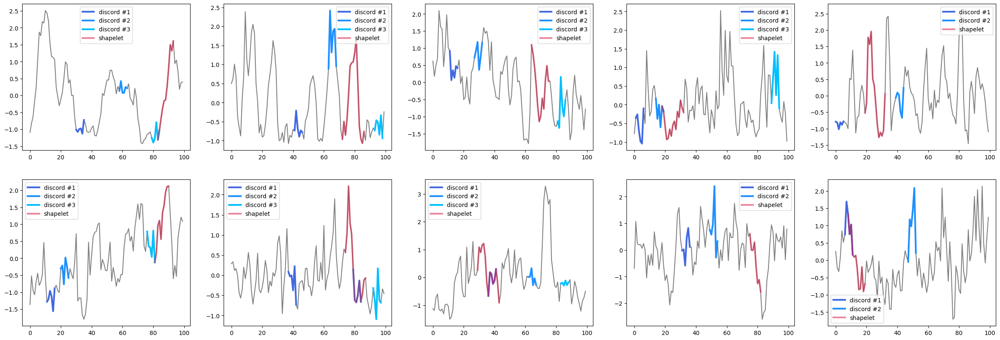

mpb


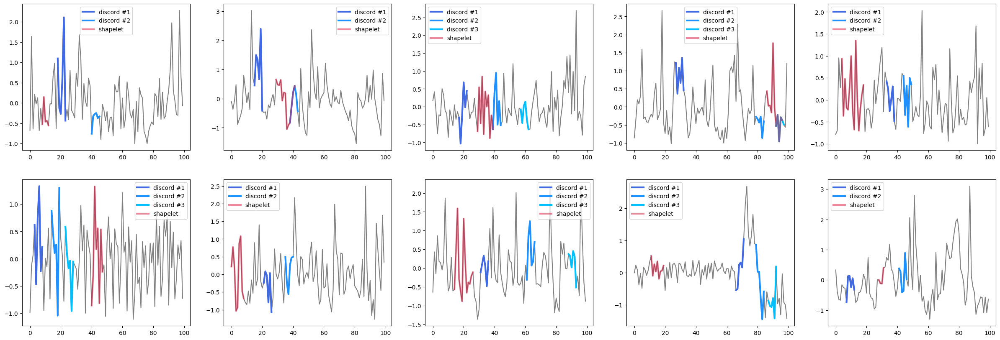

heavy-metal


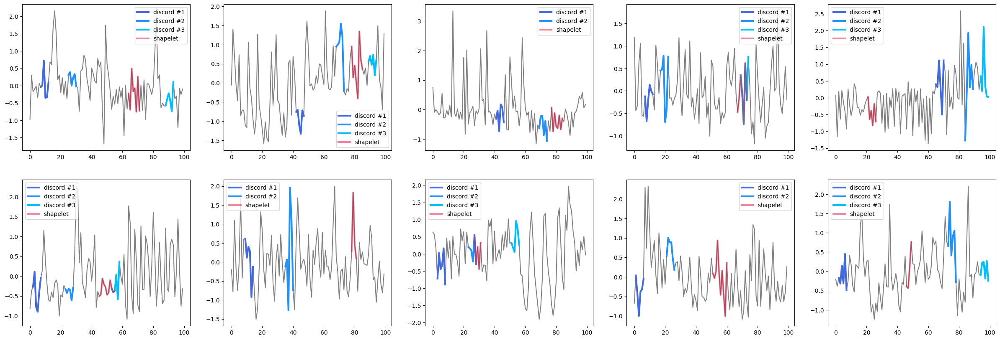

salsa


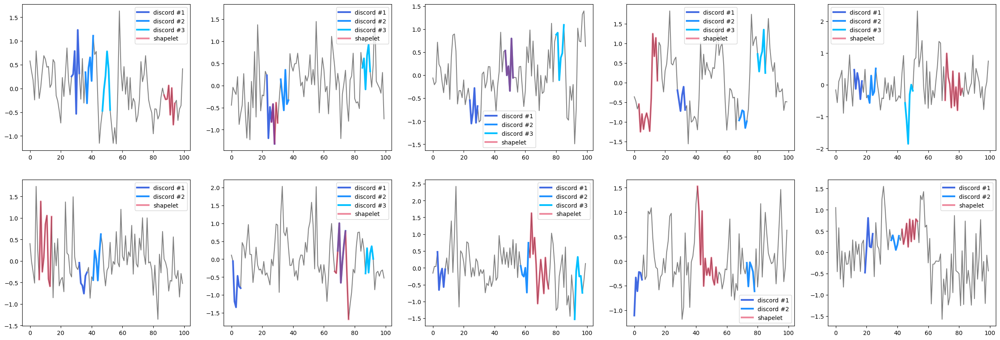

sleep


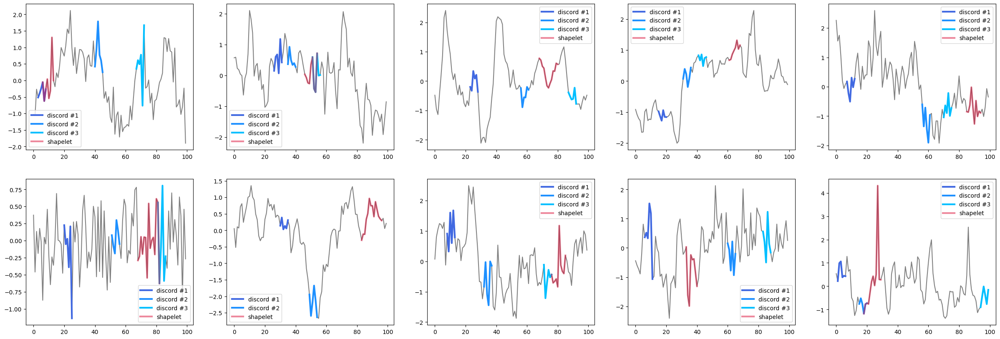

world-music


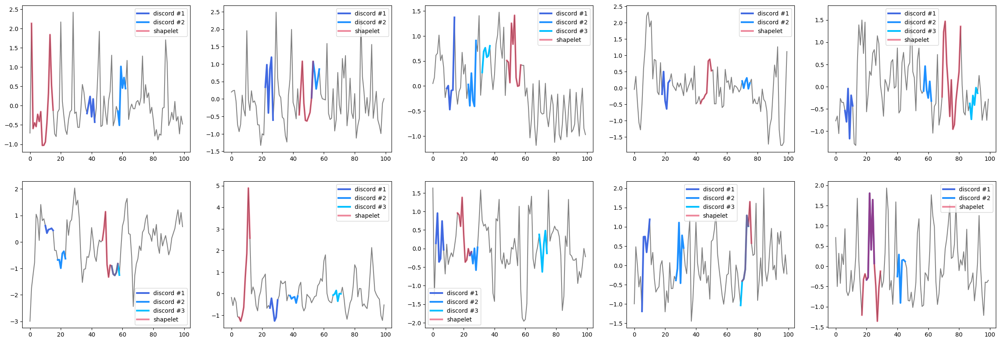

honky-tonk


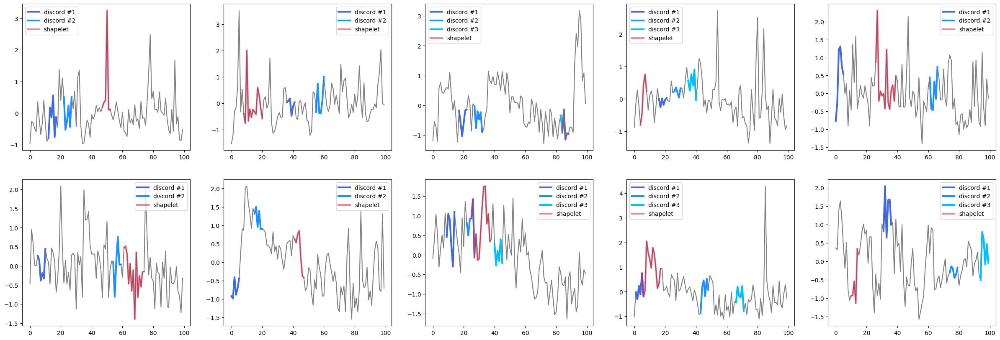

kids


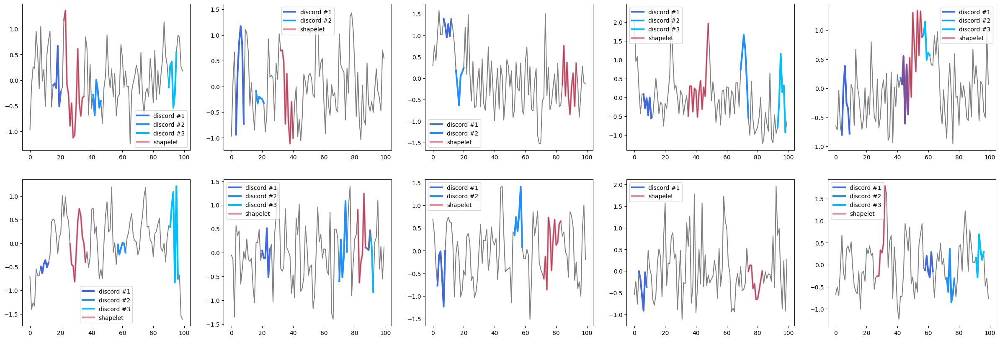

folk


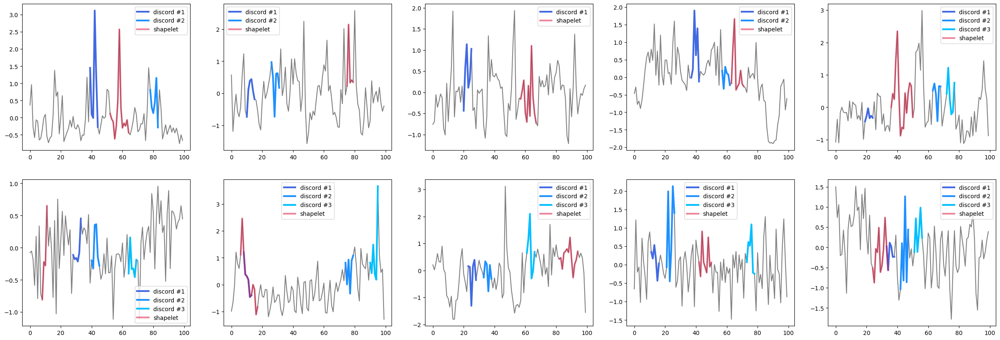

j-idol


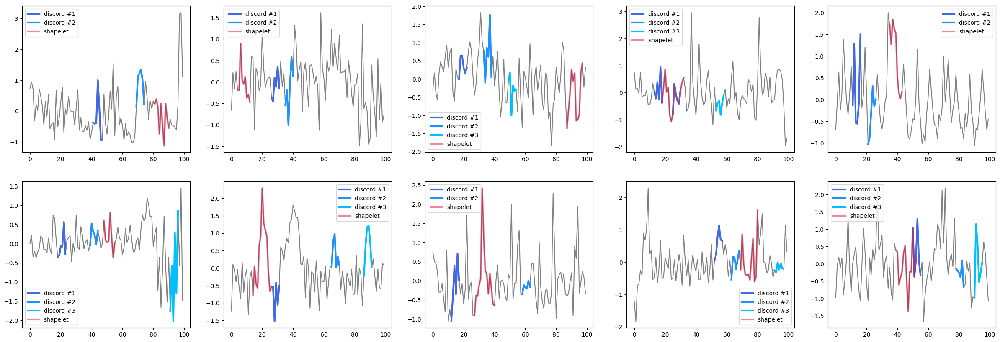

happy


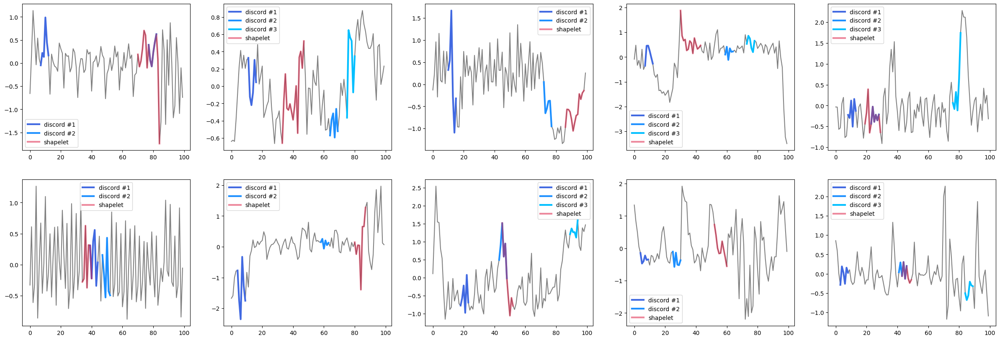

sertanejo


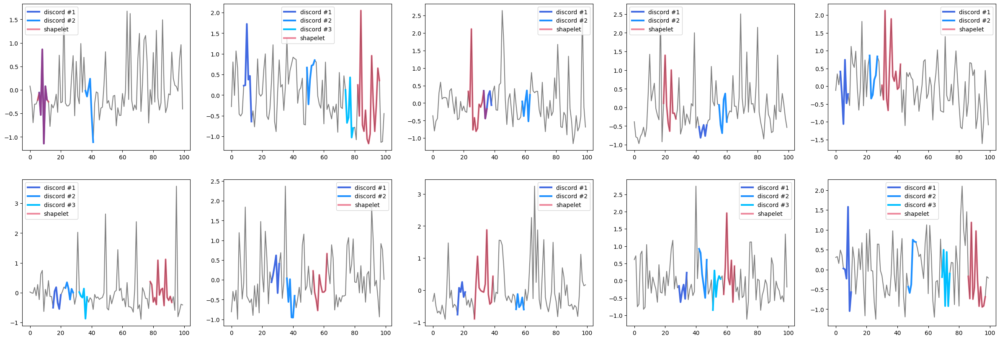

synth-pop


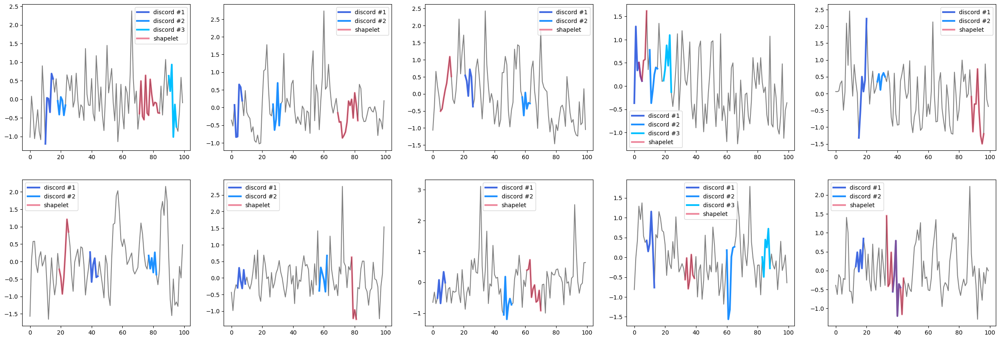

songwriter


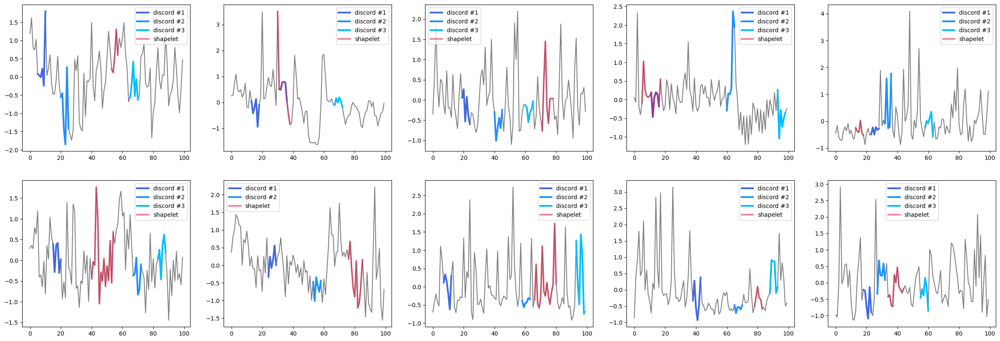

progressive-house


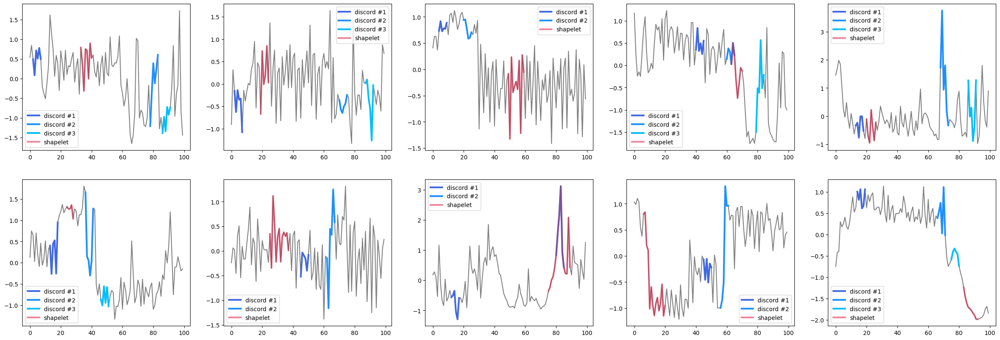

piano


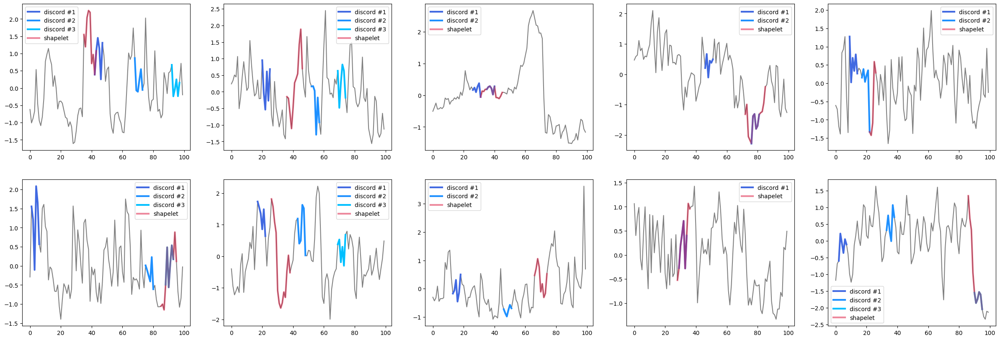

In [15]:
for genre in labels.unique():
    print(genre)
    grouped_shapelets = shapelets.where(shapelets['genre'] == genre).dropna()
    grouped_shapelets.reset_index(drop=True, inplace=True)

    fig, axs = plt.subplots(2, 5, figsize=(30, 10))

    for i, ax in zip(range(10), axs.flat):
        ts = X_train[grouped_shapelets.iloc[i]['index']].reshape(100)
        ts_index = indices_train[grouped_shapelets.iloc[i]['index']]

        ax.plot(ts, color='gray')

        # Plotting the motifs and discords
        mo = ast.literal_eval(motifs_discords.iloc[ts_index]['motifs'])
        anoms = sorted(ast.literal_eval(motifs_discords.iloc[ts_index]['discords']))
        
        colors = ['royalblue', 'dodgerblue', 'deepskyblue'][:len(mo)]
        
        # Discords
        for a, c in zip(anoms, colors):
            a_shape = ts[a:a+w]
            ax.plot(range(a, a+w), a_shape, color=c, lw=3, label=f'discord #{anoms.index(a)+1}')

        # Plotting the shapelet
        shapelet_start = grouped_shapelets.iloc[i]['start_position']
        shapelet_end = shapelet_start + grouped_shapelets.iloc[i]['length']
        ax.plot(np.arange(shapelet_start, shapelet_end),
                ts.ravel()[shapelet_start:shapelet_end], 
                lw=3,
                label='shapelet',
                color='crimson',
                alpha=0.5)
        
        ax.legend()
    plt.show()

In [ ]:
for genre in labels.unique():
    print(genre)
    grouped_shapelets = shapelets.where(shapelets['genre'] == genre).dropna()
    grouped_shapelets.reset_index(drop=True, inplace=True)

    for i in range(10):
        ts = X_train[grouped_shapelets.iloc[i]['index']].reshape(100)
        ts_index = indices_train[grouped_shapelets.iloc[i]['index']]

        plt.plot(ts, color='gray')

        # Plotting the motifs and discords
        mo = ast.literal_eval(motifs_discords.iloc[ts_index]['motifs'])
        anoms = sorted(ast.literal_eval(motifs_discords.iloc[ts_index]['discords']))
        
        colors = ['royalblue', 'dodgerblue', 'deepskyblue'][:len(mo)]

        # Motifs
        for m, c in zip(mo, colors):
            for j in m:
                m_shape = ts[j:j+w]
                plt.plot(range(j,j+w), m_shape, color=c, lw=3)
            plt.plot([0], [0], color=c, lw=3, label=f'motif #{mo.index(m)+1}')

        # Plotting the shapelet
        shapelet_start = grouped_shapelets.iloc[i]['start_position']
        shapelet_end = shapelet_start + grouped_shapelets.iloc[i]['length']
        plt.plot(np.arange(shapelet_start, shapelet_end),
                ts.ravel()[shapelet_start:shapelet_end], 
                lw=3,
                label='shapelet',
                color='crimson',
                alpha=0.5)
        plt.title(f'Time series of genre={genre}')
        plt.legend()

        plt.savefig(f'./img/Motifs/ts_{genre}_{i}.png', dpi=300, bbox_inches='tight')

        plt.plot(ts, color='gray')
        # Discords
        for a, c in zip(anoms, colors):
            a_shape = ts[a:a+w]
            plt.plot(range(a, a+w), a_shape, color=c, lw=3, label=f'discord #{anoms.index(a)+1}')

        # Plotting the shapelet
        shapelet_start = grouped_shapelets.iloc[i]['start_position']
        shapelet_end = shapelet_start + grouped_shapelets.iloc[i]['length']
        plt.plot(np.arange(shapelet_start, shapelet_end),
                ts.ravel()[shapelet_start:shapelet_end], 
                lw=3,
                label='shapelet',
                color='crimson',
                alpha=0.5)
        plt.title(f'Time series of genre={genre}')
        plt.legend()

        plt.savefig(f'./img/Discords/ts_{genre}_{i}.png', dpi=300, bbox_inches='tight')